# 0. Load parameters


In [21]:
# | tags: [parameters]
subject = "101"

In [22]:
# | tags: [parameters]
# Injected Parameters
subject = 101

In [23]:
import os
import mne
from pathlib import Path
from spectral.utils import print_date_time, read_parameters, config_project
from spectral.preproc import load_data, zapline_clean
from spectral.preproc import detrending, apply_pyprep, get_bad_channels
from spectral.viz import plot_step, plot_bad_channels
from spectral.viz import plot_epochs

import numpy as np

from spectral.ica import (
    compute_ica,
    label_components_ica,
    plot_ica_components,
    plot_removed_components,
)

mne.viz.set_browser_backend("matplotlib")
# mne.viz.set_browser_backend("qt")
mne.set_config("MNE_BROWSER_THEME", "light")
# matplotlib.use("Agg")

config = read_parameters()
my_paths = config_project(subject)

project_path = my_paths["project_path"]
raw_preproc_path = my_paths["raw_preproc_path"]
print(raw_preproc_path)
Path(raw_preproc_path).mkdir(parents=True, exist_ok=True)

figures_path = my_paths["figures_path"]

print_date_time()

/Users/daniel/PhD/Projects/psd-path/analysis/data/raw/sub-101/
2024-04-20 17:03:18


This file contains preprocessing files after downsampling them.


Reading EGI MFF Header from /Volumes/ExtremePro/DATA PATHS/DATI_PATHS/Raw_data/PATHS_101_Resting_20191120_022103.mff...
    Reading events ...
    Assembling measurement info ...
<DigMontage | 0 extras (headshape), 0 HPIs, 3 fiducials, 256 channels>


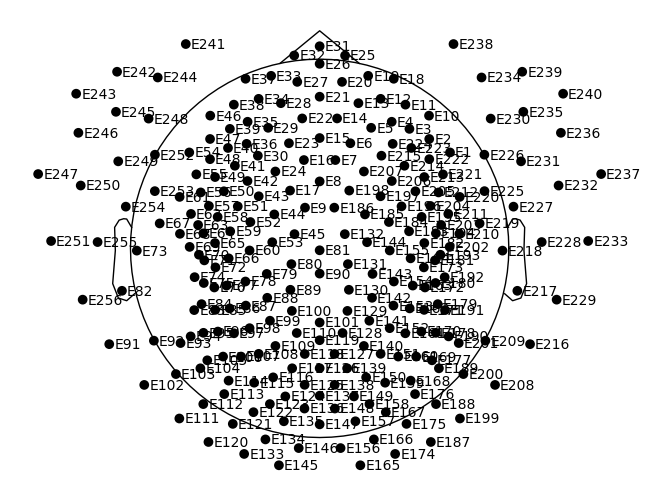

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


Measurement date,"November 20, 2019 13:21:02 GMT"
Experimenter,Unknown
Participant,Unknown
Digitized points,259 points
Good channels,"256 EEG, 1 ECG"
Bad channels,None
EOG channels,Not available
ECG channels,ECG
Sampling frequency,1000.00 Hz
Highpass,0.00 Hz
Lowpass,500.00 Hz


In [4]:
file_path = "/Volumes/ExtremePro/DATA PATHS/DATI_PATHS/Raw_data/PATHS_101_Resting_20191120_022103.mff"

raw = mne.io.read_raw_egi(file_path)
montage = mne.channels.make_standard_montage("GSN-HydroCel-256")
dig_montage = mne.channels.read_custom_montage(
    "/Volumes/ExtremePro/DATA PATHS/DATI_PATHS/sfp/PATHS_101_PRE_sensposMR_fix.sfp"
)
print(montage)
montage.plot()
raw.pick_channels([ch for ch in raw.ch_names if ch != "VREF"])

raw.set_montage(montage)

LOF: Detected bad channel(s): ['E9', 'E31', 'E37', 'E80', 'E82', 'E101', 'E117', 'E128', 'E130', 'E138', 'E165', 'E226', 'E243', 'E250', 'E256']


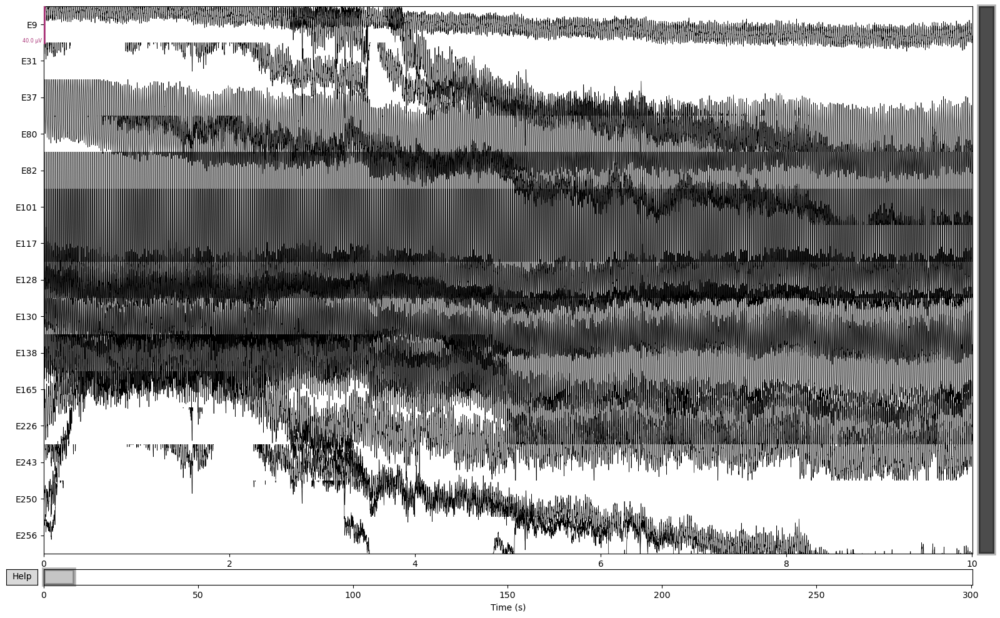

['E9', 'E31', 'E37', 'E80', 'E82', 'E101', 'E117', 'E128', 'E130', 'E138', 'E165', 'E226', 'E243', 'E250', 'E256']


In [5]:
bad_channels = mne.preprocessing.find_bad_channels_lof(raw)
raw.plot(picks=bad_channels)
print(bad_channels)

In [ ]:
 dss.dss_line_iter(temp_data, fline, sfreq, **iter_param)

 def zapline_clean(raw, fline, method="line", iter_param=None):
    """Apply the zapline cleaning"""
    raw
    data = raw.get_data().T  # Convert mne data to numpy darray
    sfreq = raw.info["sfreq"]  # Extract the sampling freq
    # Apply MEEGkit toolbox function

    if method == "iter":
        temp_data, _ = dss.dss_line_iter(data, fline, sfreq, **iter_param)
        temp_data, _ = dss.dss_line_iter(temp_data, fline, sfreq, **iter_param)
        temp_data, _ = dss.dss_line_iter(temp_data, fline, sfreq, **iter_param)
        out, _ = dss.dss_line_iter(temp_data, fline, sfreq, **iter_param)
    elif method == "line":
        out, _ = dss.dss_line(data, fline, sfreq, nremove=15)

    cleaned_raw = mne.io.RawArray(
        out.T, raw.info
    )  # Convert output to mne RawArray again
    cleaned_raw.set_annotations(raw.annotations)
    return cleaned_raw


In [20]:
from meegkit import dss
iter_param = {
    "nfft": 500,
    "n_iter_max": 200,
    "win_sz": 12.5,
    "spot_sz": 5,
}

fline = 50


def zapline_iter(data, iter_param=None):
    temp_data, _ = dss.dss_line_iter(
        data.T, fline=500, sfreq=250, **iter_param)
    return temp_data.T


raw_resampled = raw.copy().resample(sfreq=250)


FileNotFoundError: [Errno 2] No such file or directory: '/Volumes/ExtremePro/DATA PATHS/DATI_PATHS/Raw_data/PATHS_101_Resting_20191120_022103.mff/signal1.bin'

In [ ]:
raw_resampled.apply_function(
    zapline_iter, iter_param=iter_param)

In [18]:
# Authors: Quentin Barthélemy & David Ojeda.
# EEG signal kindly shared by Marco Congedo.
#
# License: BSD (3-clause)

import gzip
import numpy as np
from matplotlib import pyplot as plt
from mne import create_info
from mne.io import RawArray
from mne.viz import plot_topomap
from mne.preprocessing import ICA
from scipy.signal import welch

from pyriemann.spatialfilters import AJDC
from pyriemann.utils.viz import plot_cospectra

# Compute and diagonalize Fourier cospectral matrices between 1 and 32 Hz
ch_names = raw.ch_names
sfreq = raw.info['sfreq']
window, overlap = sfreq, 0.5

fmin, fmax = 1, 32
ajdc = AJDC(window=window, overlap=overlap, fmin=fmin, fmax=fmax, fs=sfreq,
            dim_red={'max_cond': 100})
ajdc.fit(raw[np.newaxis, np.newaxis, ...])
freqs = ajdc.freqs_

# Plot cospectra in channel space, after trace-normalization by frequency: each
# cospectrum, associated to a frequency, is a covariance matrix
plot_cospectra(ajdc._cosp_channels, freqs, ylabels=ch_names,
               title='Cospectra, in channel space')

RuntimeError: Unable to access raw data (need both channels and time)

In [ ]:
Making this a good funtion

https://pyriemann.readthedocs.io/en/latest/auto_examples/artifacts/plot_correct_ajdc_EEG.html#sphx-glr-auto-examples-artifacts-plot-correct-ajdc-eeg-py


In [1]:
import mne

file_path = "/Volumes/ExtremePro/DATA PATHS/DATI_PATHS/Raw_data/PATHS_101_Resting_20191120_022103.mff"
raw = mne.io.read_raw_egi(file_path)
dig_montage = mne.channels.read_custom_montage(
    "/Volumes/ExtremePro/DATA PATHS/DATI_PATHS/sfp/PATHS_101_PRE_sensposMR_fix.sfp"
)
print(dig_montage)

Reading EGI MFF Header from /Volumes/ExtremePro/DATA PATHS/DATI_PATHS/Raw_data/PATHS_101_Resting_20191120_022103.mff...
    Reading events ...
    Assembling measurement info ...
<DigMontage | 0 extras (headshape), 0 HPIs, 0 fiducials, 258 channels>


In [4]:
dig_montage.plot()

/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_4152/3558419565.py:1: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  dig_montage.plot()


RuntimeError: No valid channel positions found

In [ ]:
raw.set_montage(dig_montage, match_alias={"VREF": "Cz"})

In [1]:
fline = 50
h_freq = 45
notch_freq = 50

filter_params = {
    "l_freq": 1,
    "h_freq": h_freq,
    "h_trans_bandwidth": "auto",
    "fir_window": "hamming",
    "fir_design": "firwin2",
    "phase": "zero",
}

raw.info["bads"] = ["VREF"]

plot_step(
    raw,
    subject,
    figures_path,
    stage="raw_filtered",
    duration=25.0,
    n_channels=25,
    fmax=h_freq,
)

Reading EGI MFF Header from /Volumes/ExtremePro/DATA PATHS/DATI_PATHS/Raw_data/PATHS_101_Resting_20191120_022103.mff...
    Reading events ...
    Assembling measurement info ...


NameError: name 'plot_step' is not defined

Effective window size : 5.000 (s)


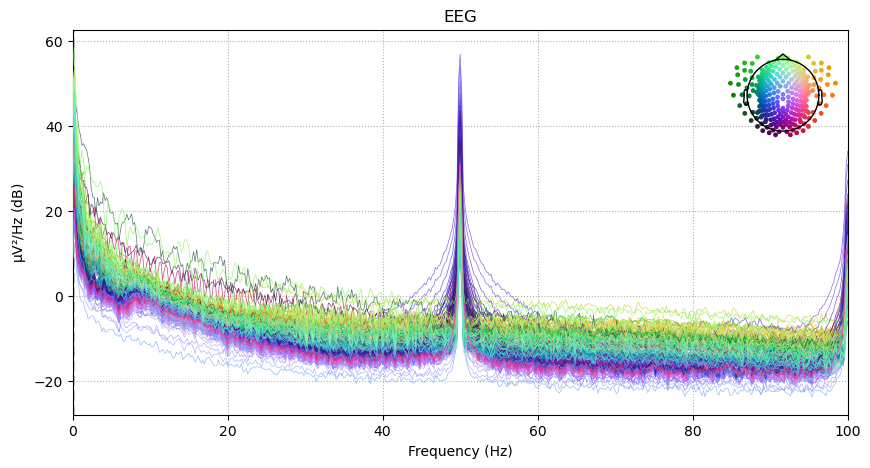

In [14]:
import matplotlib.pyplot as plt

n_fft = 5 * int(raw.info["sfreq"])

fig, ax = plt.subplots(figsize=(10, 5))
raw_psd = raw.compute_psd(
    fmax=100, method="welch", picks="eeg", exclude="bads", n_fft=n_fft
).plot(average=False, picks="eeg", exclude="bads", show=False, axes=ax)

In [16]:
iter_param = {
    "nfft": 2000,
    "n_iter_max": 200,
    "win_sz": 12.5,
    "spot_sz": 6,
}
raw_zap = zapline_clean(raw, fline, method="iter", iter_param=iter_param)

plot_step(
    raw_zap,
    subject,
    figures_path,
    stage="raw_zap ",
    duration=25.0,
    n_channels=25,
    fmax=h_freq,
)

Power of components removed by DSS: 0.01
Iteration 0 score: 1.588151434328835e-11
Power of components removed by DSS: 0.00
Iteration 1 score: 1.9800652955011474e-12
Power of components removed by DSS: 0.00
Iteration 2 score: 8.615124017729844e-13
Power of components removed by DSS: 0.00
Iteration 3 score: 4.1587614602128124e-13
Power of components removed by DSS: 0.00
Iteration 4 score: 2.5352287194699643e-13
Power of components removed by DSS: 0.00
Iteration 5 score: 2.553284068960459e-13
Power of components removed by DSS: 0.00
Iteration 6 score: 2.1516885384148588e-13
Power of components removed by DSS: 0.00
Iteration 7 score: 1.3787554864685482e-13
Power of components removed by DSS: 0.00
Iteration 8 score: 1.27479577739496e-13
Power of components removed by DSS: 0.00
Iteration 9 score: 7.704878774111131e-14
Power of components removed by DSS: 0.00
Iteration 10 score: 3.7960024176714586e-14
Power of components removed by DSS: 0.00
Iteration 11 score: 3.472613335441796e-14
Power of 

RuntimeError: Could not converge. Consider increasing the maximum number of iterations

In [ ]:
raw_filtered = (
    raw.load_data()
    .crop(tmin=0, tmax=300, include_tmax=True)
    .notch_filter(
        freqs=[50.0, 100.0, 150, 200.0],
        phase="zero",
    )
    .filter(**filter_params)
)

# 1. Preprocess raw data


In [8]:
fline = 50
h_freq = 45
notch_freq = 50

filter_params = {
    "l_freq": 1,
    "h_freq": h_freq,
    "h_trans_bandwidth": "auto",
    "fir_window": "hamming",
    "fir_design": "firwin2",
    "phase": "zero",
}


# .notch_filter(freqs=50)  # removedrifts
# print(project_path)
raw = load_data(subject, project_path=project_path)
raw.info["bads"] = ["VREF"]
raw = raw.resample(500)
# raw_detrended = detrending(raw)
print("Detrending done")

raw_filtered = (
    raw.copy()
    .crop(tmin=0, tmax=300, include_tmax=True)
    .notch_filter(
        freqs=[50.0, 100.0, 150, 200.0],
        phase="zero",
    )
    .filter(**filter_params)
)

Loading data from /Users/daniel/PhD/Projects/psd-path/data/raw/BIDS/sub-101/ses-01/eeg/sub-101_ses-01_task-rest_eeg.set
Detrending done
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3301 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.3s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hamming window
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 3301 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.4s


In [10]:
bad_channels_by_ransac = apply_pyprep(
    raw_filtered, output="dict", as_dict=True)

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 413 samples (3.304 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s


Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 244
Total # of chunks: 1
Current chunk:
1

RANSAC done!


In [11]:
print(bad_channels_by_ransac)

{'bad_by_nan': [], 'bad_by_flat': [], 'bad_by_deviation': ['E217'], 'bad_by_hf_noise': [], 'bad_by_correlation': ['E9', 'E91', 'E132', 'E133', 'E145', 'E174', 'E187', 'E216', 'E217', 'E229', 'E251', 'E256'], 'bad_by_SNR': [], 'bad_by_dropout': [], 'bad_by_ransac': [], 'bad_all': ['E132', 'E217', 'E187', 'E216', 'E256', 'E9', 'E133', 'E145', 'E251', 'E229', 'E91', 'E174']}


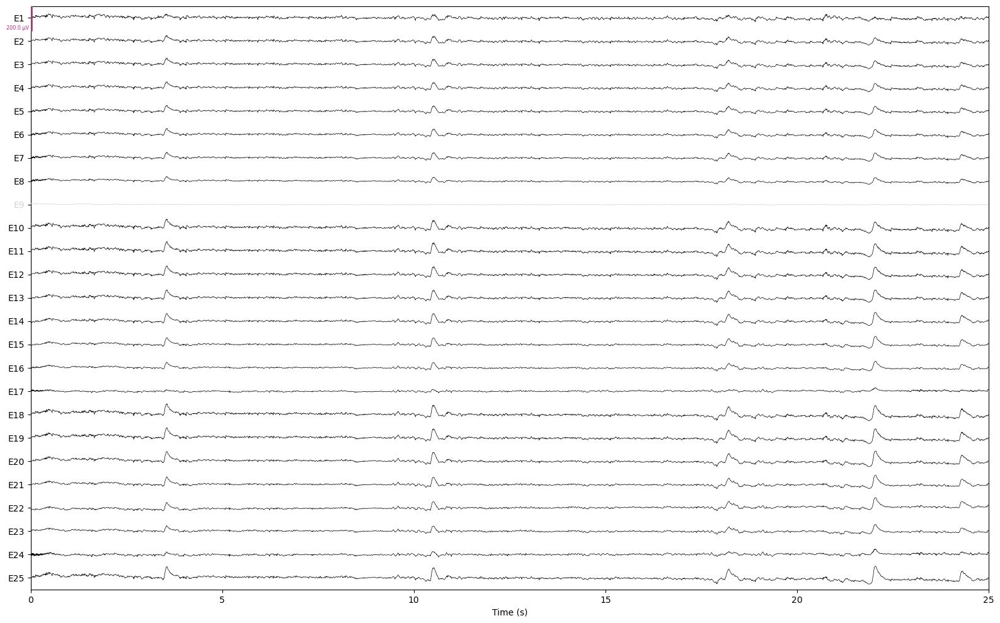

Effective window size : 4.096 (s)


/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/viz.py:33: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown


Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,260 points
Good channels,"244 EEG, 1 ECG"
Bad channels,"VREF, E132, E217, E187, E216, E256, E9, E133, E145, E251, E229, E91, E174"
EOG channels,Not available
ECG channels,ECG
Sampling frequency,500.00 Hz
Highpass,1.00 Hz
Lowpass,45.00 Hz


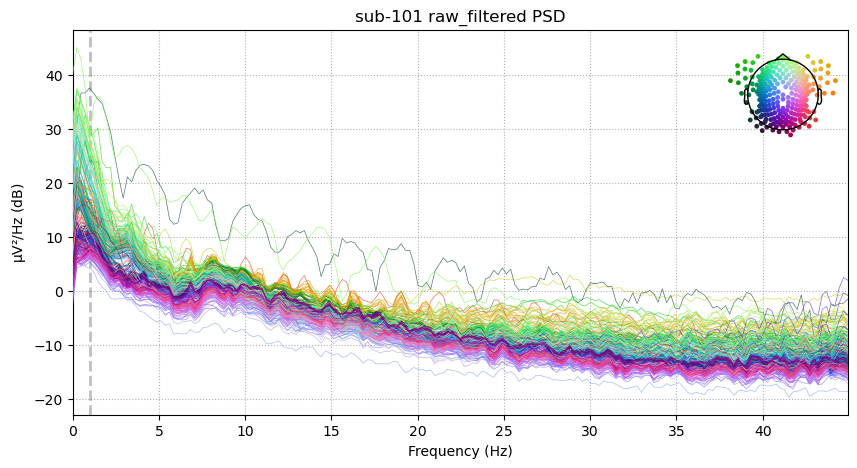

In [12]:
raw_filtered.info["bads"].extend(bad_channels_by_ransac["bad_all"])

plot_step(
    raw_filtered,
    subject,
    figures_path,
    stage="raw_filtered",
    duration=25.0,
    n_channels=25,
    fmax=h_freq,
)
raw_filtered.info

In [30]:
import numpy as np
from mne import pick_types

6.0289737400917094e-05
Finding segments below or above PTP threshold.
<Annotations | 94 segments: BAD_peak (94)>
<Annotations | 94 segments: BAD_peak (94)>


In [31]:
with mne.viz.use_browser_backend("qt"):
    raw_filtered.copy().set_annotations(annot).plot()

Using qt as 2D backend.


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_43975/1599453922.py:2: RuntimeWarning: Limited 49 annotation(s) that were expanding outside the data range.
  raw_filtered.copy().set_annotations(annot).plot()
2024-03-29 01:06:22,039 - qdarkstyle - INFO - QSS file successfully loaded.
2024-03-29 01:06:22,039 - qdarkstyle - INFO - Found OS patches to be applied.
2024-03-29 01:06:22,040 - qdarkstyle - INFO - Found version patches to be applied.
2024-03-29 01:06:22,040 - qdarkstyle - INFO - Found application patches to be applied.


Using pyopengl with version 3.1.6
Using matplotlib as 2D backend.


Not setting metadata
85 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 85 events and 2501 original time points ...


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_43975/2367040174.py:3: RuntimeWarning: Limited 49 annotation(s) that were expanding outside the data range.
  raw_annotated = raw_filtered.copy().set_annotations(annot)


11 bad epochs dropped
fitting finished
Dropped 5 epochs: 5, 13, 14, 34, 56


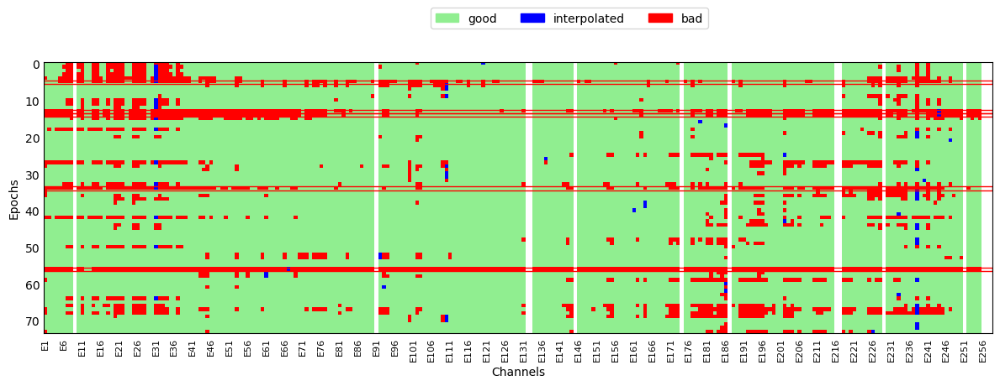

In [38]:
from spectral.epochs import create_epochs, get_reject_log

raw_annotated = raw_filtered.copy().set_annotations(annot)
epochs = create_epochs(raw_annotated, overlap=1.5)

reject_log = get_reject_log(epochs, resample=125, n_interpolate=[1], consensus=[0.4])
reject_plot = reject_log.plot("vertical")

In [41]:
# Drop channels with more than 30% bad epochs
BADS_THRESHOLD = 0.4

bads = np.logical_or(reject_log.labels == 1, reject_log.labels == 2)

bad_channel = bads.mean(axis=0)
# print(bad_channel)
epochs.info
channel_names = epochs.info["ch_names"]
bad_channels_by_epochs = [
    name for name, value in zip(channel_names, bad_channel) if value > BADS_THRESHOLD
]
print(
    f"Additional {len(bad_channels_by_epochs)} bad channels found:{
        bad_channels_by_epochs}"
)
epochs.info["bads"].extend(bad_channels_by_epochs)

Additional 5 bad channels found:['E20', 'E25', 'E32', 'E186', 'E238']


In [42]:
epochs_remove = epochs.copy().drop_channels(bad_channels_by_epochs)

bad_channels_epochs = epochs.copy().pick(bad_channels_by_epochs)
print(bad_channels_epochs)

try:
    if bad_channels_by_epochs:
        plot_epochs(
            bad_channels_epochs,
            figures_path=figures_path,
            subject=subject,
            stage="bad channels by number of rejected epochs",
            n_epochs=len(epochs[reject_log.bad_epochs]),
            n_channels=40,
        )
except Exception as e:
    print(f"Error: {e}")

<Epochs |  74 events (all good), 0 – 5 s, baseline off, ~7.2 MB, data loaded,
 '1': 74>
Error: picks (NoneNone, treated as "data") yielded no channels, consider passing picks explicitly


Fitting ICA to data using 239 channels (please be patient, this may take a while)
Selecting by explained variance: 37 components
Fitting ICA took 17.0s.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/ica.py:28: RuntimeWarning: The provided Epochs instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(eeg_data, ica, method="iclabel")
/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/ica.py:28: RuntimeWarning: The provided Epochs instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(eeg_data, ica, method="iclabel")
/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/ica.py:28: RuntimeWarning: The provided Epochs instance does not seem

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
bad_prob_class [0, 1, 2, 4, 7, 8, 9, 10, 12, 14, 15, 16, 17, 18, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 33, 34, 36]


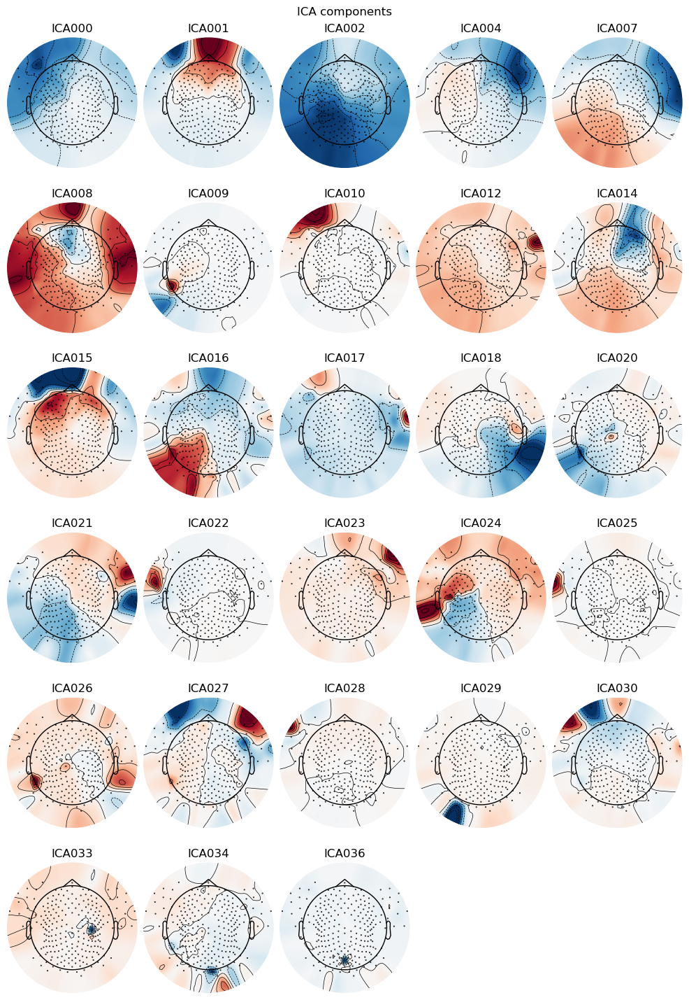

Not setting metadata
69 matching events found
No baseline correction applied
0 projection items activated


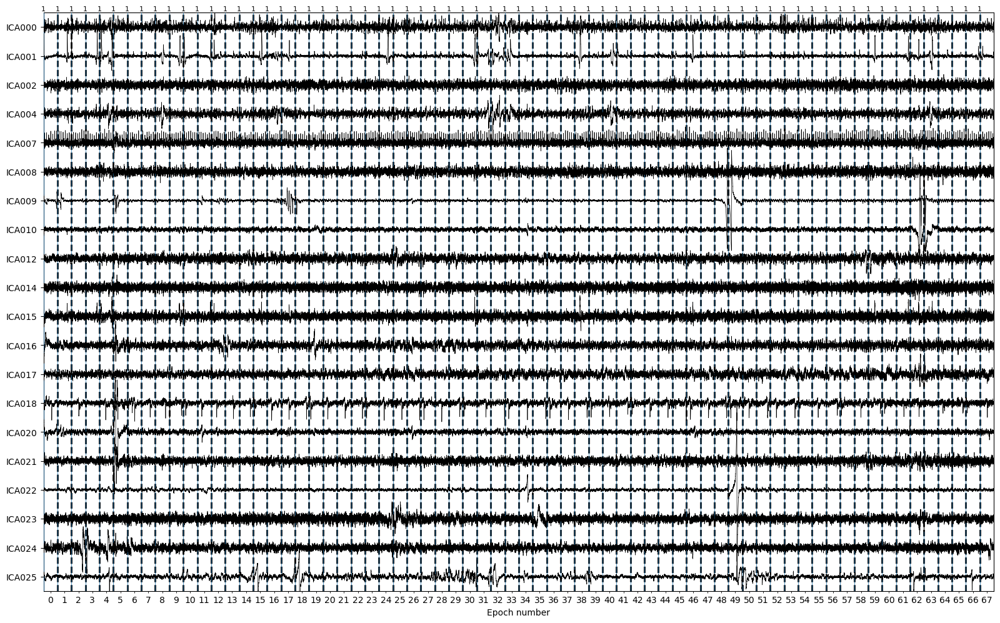

Not setting metadata
69 matching events found
No baseline correction applied
0 projection items activated


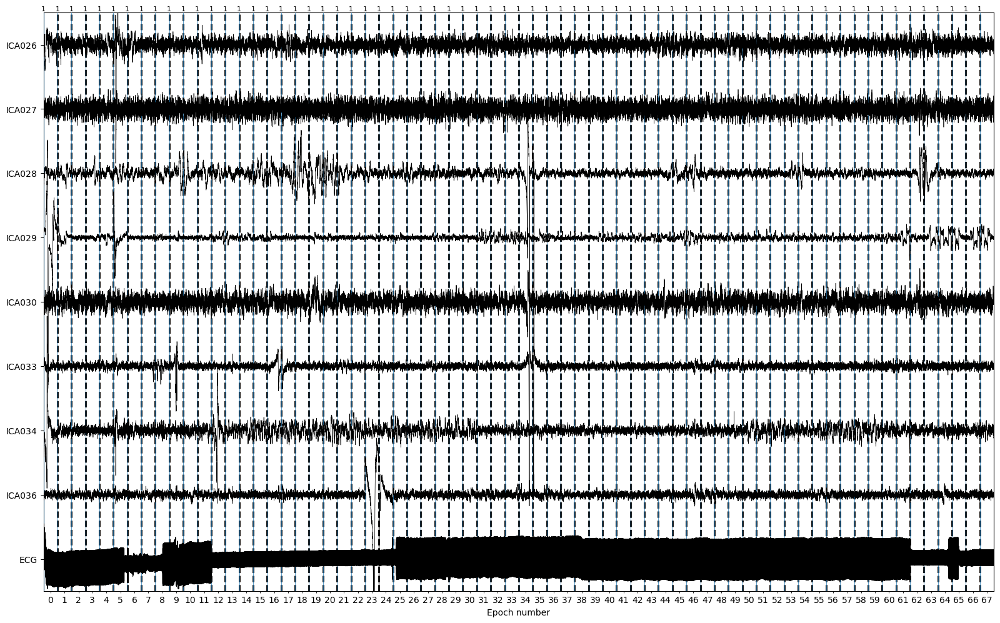

brain [3, 5, 6]


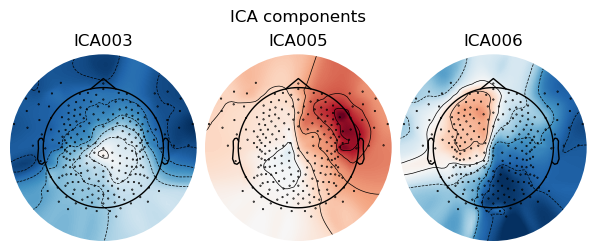

Not setting metadata
69 matching events found
No baseline correction applied
0 projection items activated


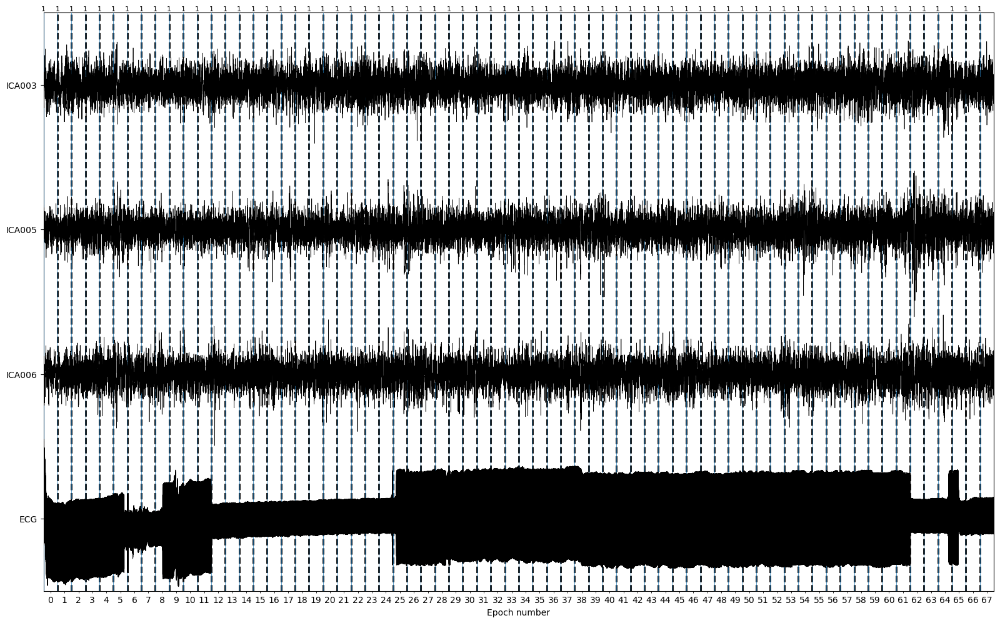

other [11, 13, 19, 31]


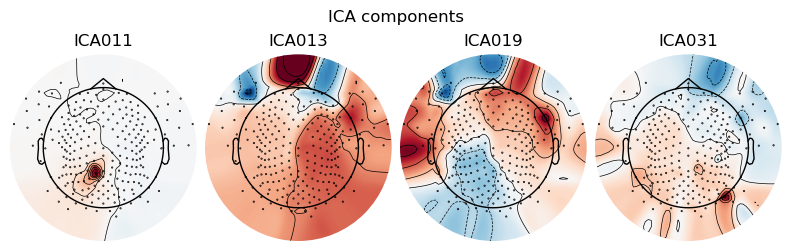

Not setting metadata
69 matching events found
No baseline correction applied
0 projection items activated


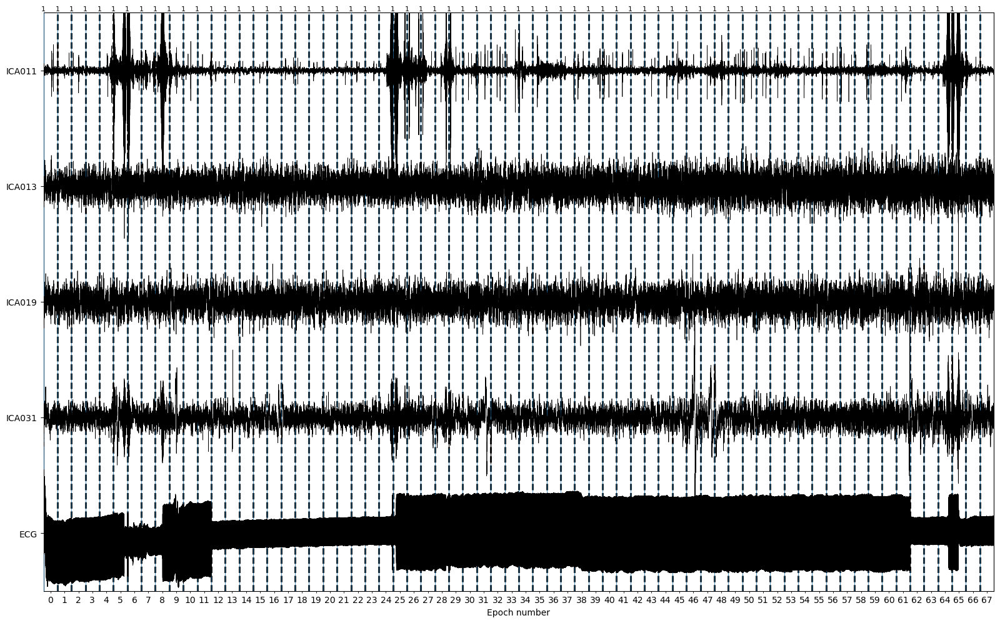

channel noise [32, 35]


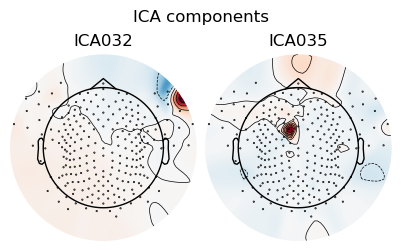

Not setting metadata
69 matching events found
No baseline correction applied
0 projection items activated


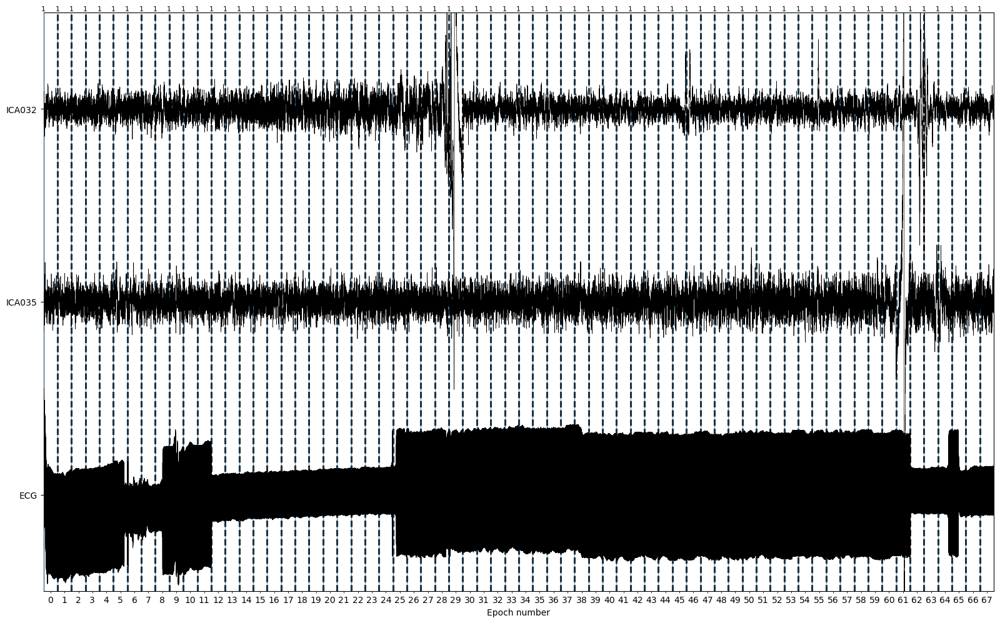

In [43]:
epochs_good = epochs[~reject_log.bad_epochs]
ica = compute_ica(epochs_good, n_components=0.99, method="picard")
labels, ic_labels = label_components_ica(epochs_good, ica)
labeled_components = plot_ica_components(
    ica,
    epochs_good,
    subject=subject,
    figures_path=figures_path,
    plot_properties=False,
)

In [44]:
ecg_indices, ecg_scores = ica.find_bads_ecg(
    raw_annotated, method="correlation", threshold="auto"
)
# ica.exclude = np.argwhere(abs(eog_scores) > 0.5).ravel().tolist()
if ecg_indices:
    # barplot of ICA component "EOG match" scores
    ica.plot_properties(raw_annotated, picks=ecg_indices)

    # plot ICs applied to raw data, with ECG matches highlighted
    ecg_plot = ica.plot_sources(
        raw_annotated,
        show_scrollbars=False,
        picks=ecg_indices,
        start=0,
        stop=len(epochs) - 1,
    )

Omitting 12346 of 150001 (8.23%) samples, retaining 137655 (91.77%) samples.
Omitting 12346 of 150001 (8.23%) samples, retaining 137655 (91.77%) samples.
... filtering ICA sources
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cuto

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated


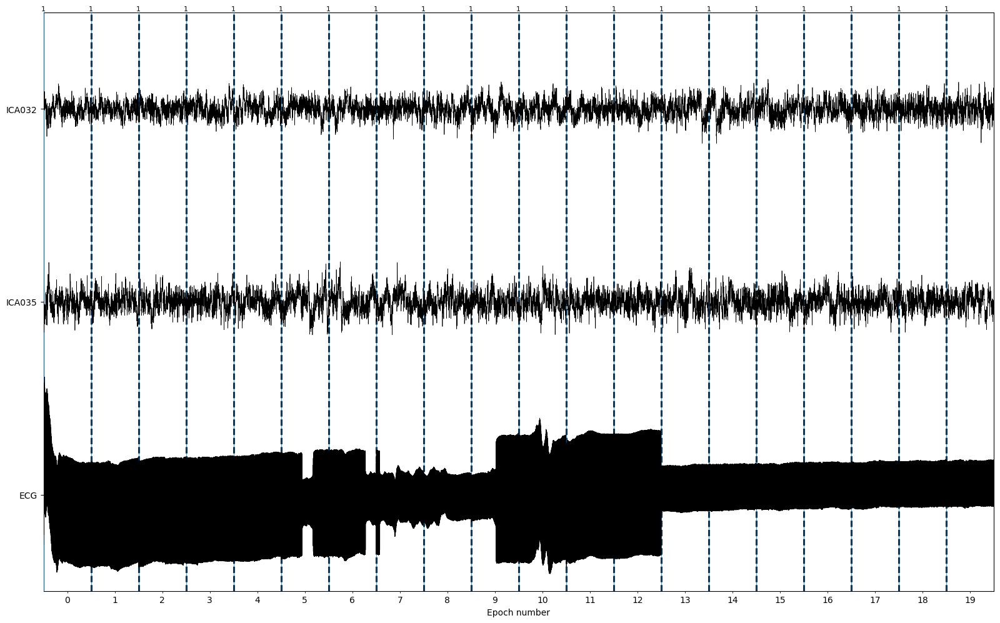

channel noise [32, 35]
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated


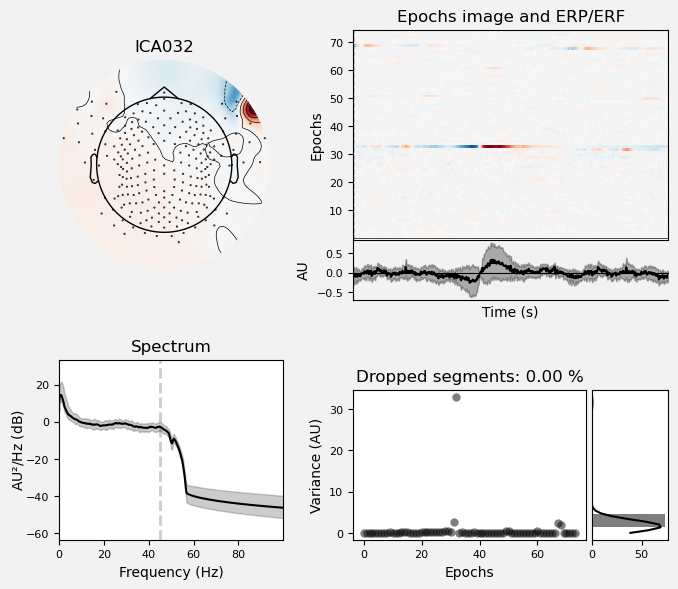

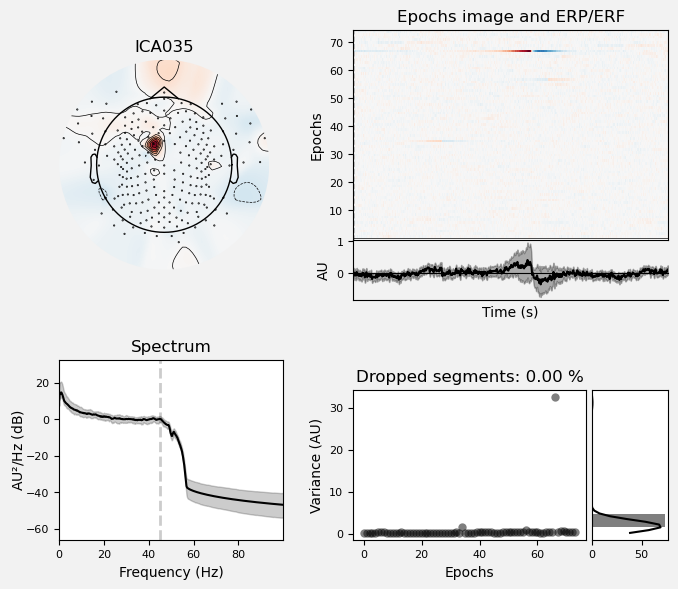

In [45]:
chosen_components = [
    "eye blink",
    "heart beat",
    "line noise",
    "muscle artifact",
    "channel noise",
]
exclude = plot_removed_components(
    ica,
    epochs,
    subject=subject,
    figure_path=figures_path,
    labeled_components=labeled_components,
    chosen_components=chosen_components,
)

Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated


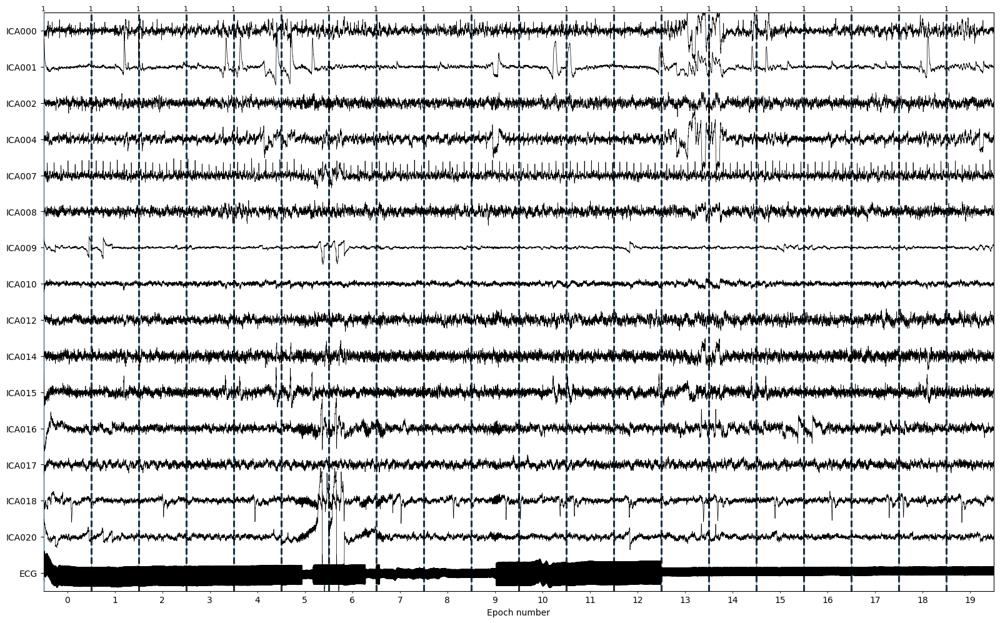

Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated


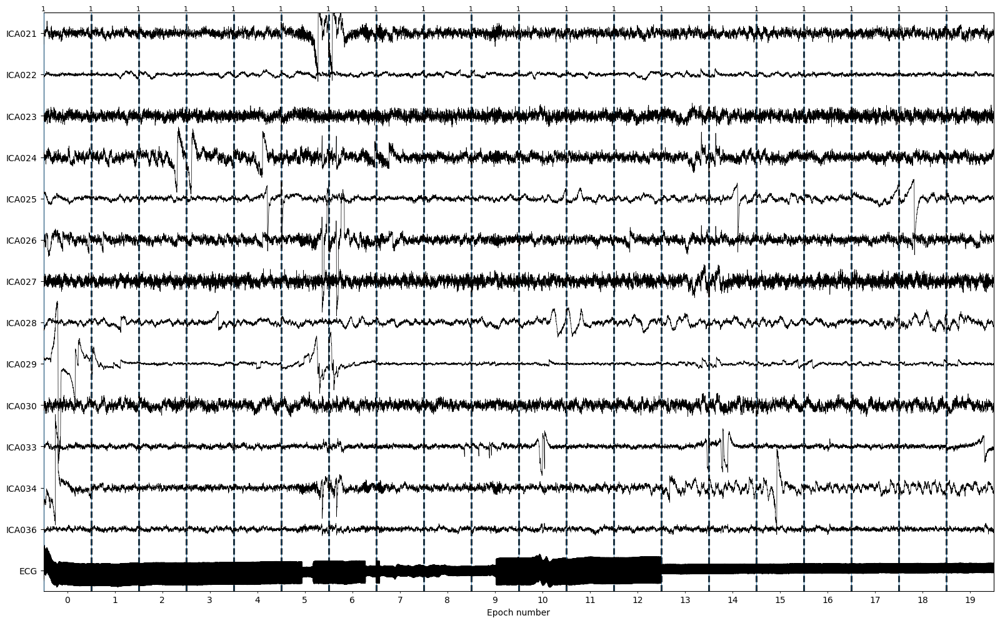

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection i

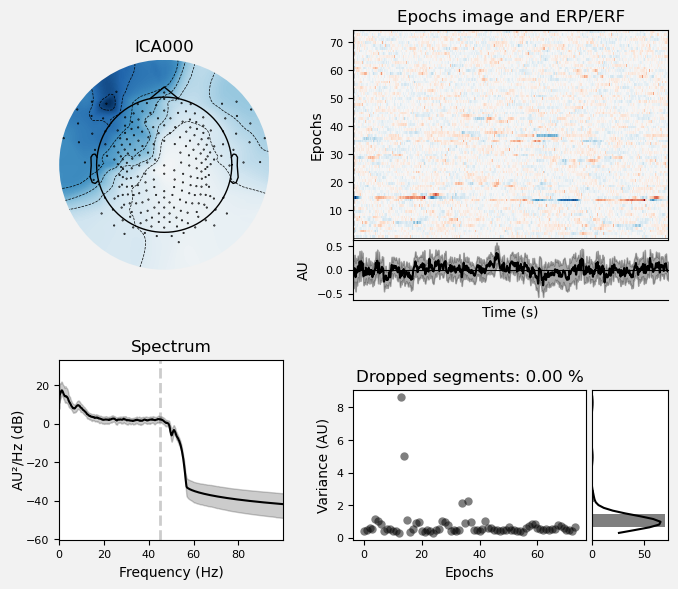

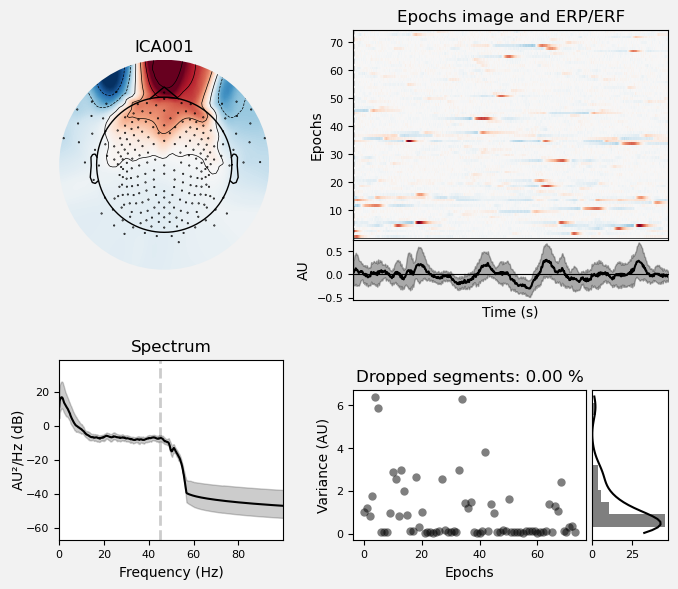

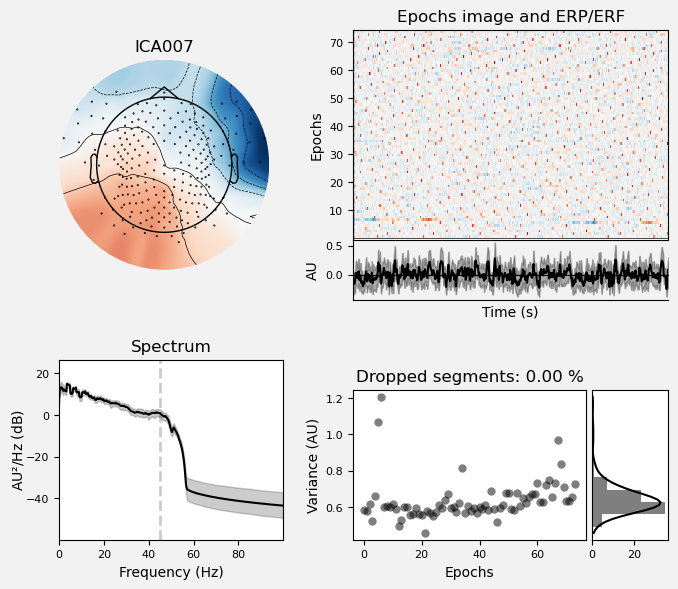

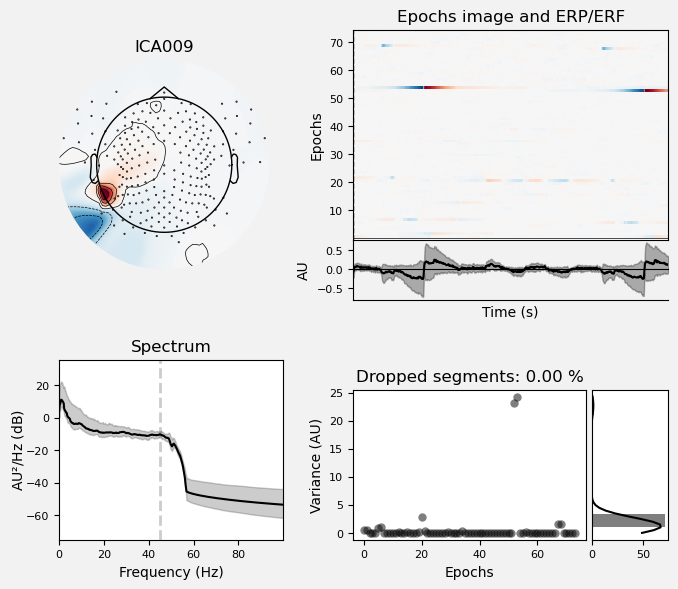

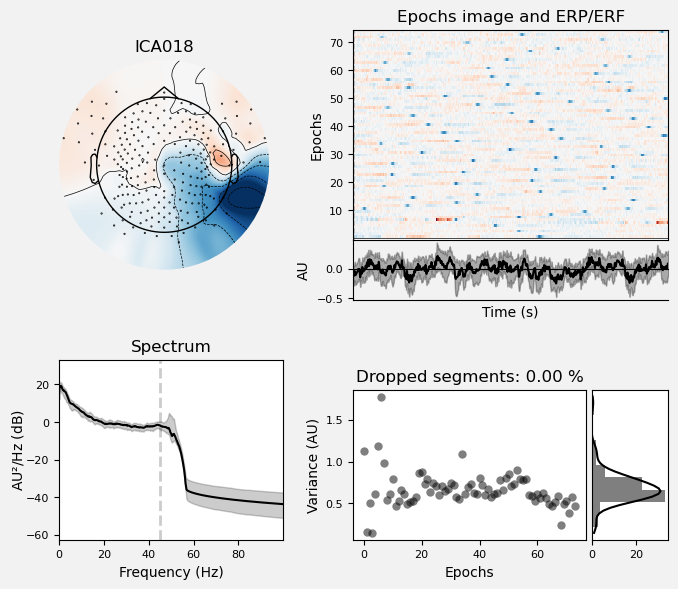

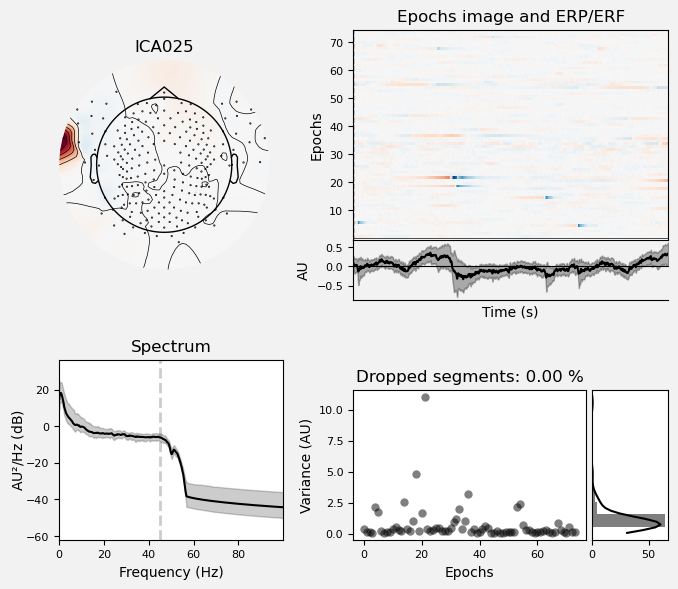

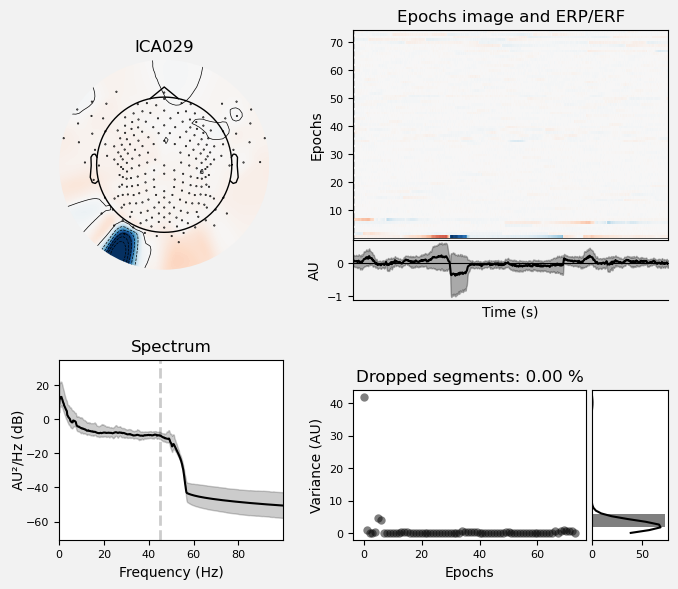

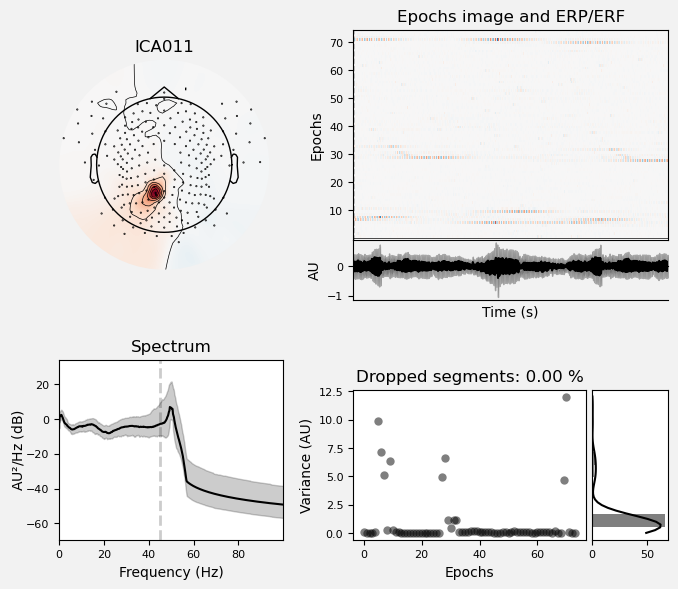

In [48]:
chunk_size = 15
indices = labeled_components["bad_prob_class"]
chunks = [indices[i: i + chunk_size]
          for i in range(0, len(indices), chunk_size)]
for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs,
        show_scrollbars=False,
        picks=chunk,
        start=0,
        stop=20,
    )
# [1, 19, 36] template should not have manual excluded be used
manual_exclude = [0, 1, 7, 9, 18, 25, 29, 11]  # [1, 2, 3, 12, 20, 28]
if manual_exclude:
    figs = ica.plot_properties(
        epochs, picks=manual_exclude, psd_args={"fmax": 100.0})

Applying ICA to Epochs instance
    Transforming to ICA space (37 components)
    Zeroing out 10 ICA components
    Projecting back using 239 PCA components
No projector specified for this dataset. Please consider the method self.add_proj.


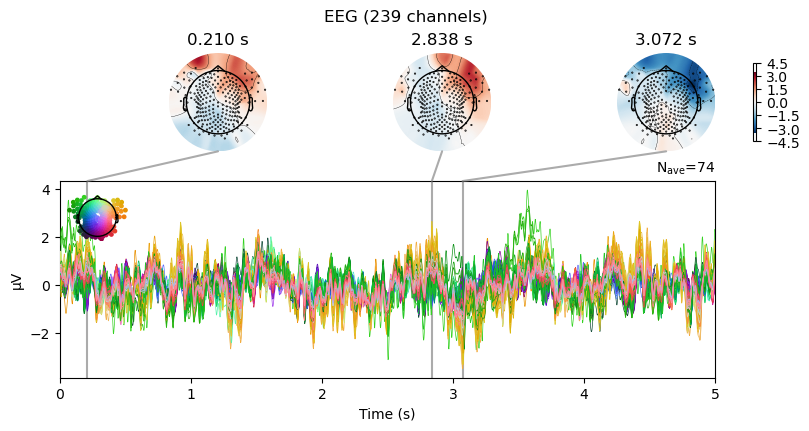

Effective window size : 4.096 (s)
Averaging across epochs...


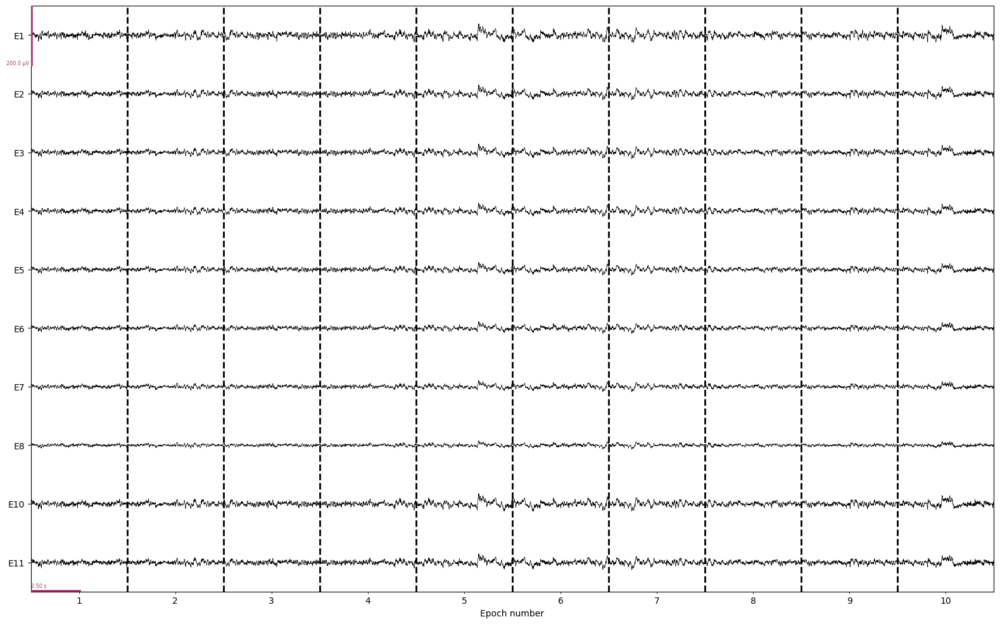

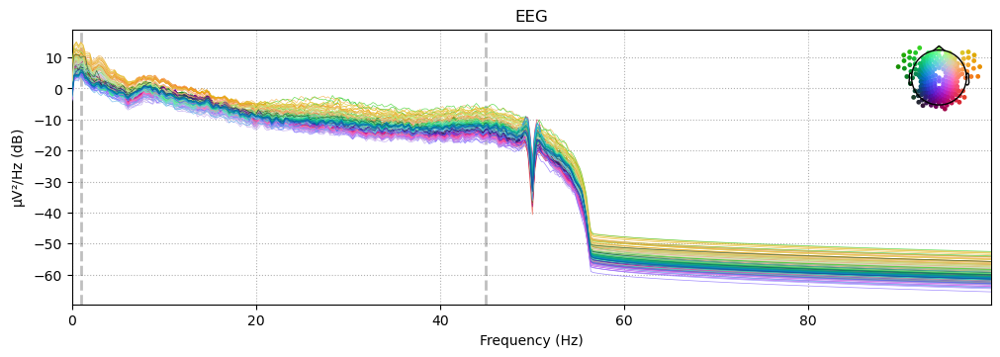

In [49]:
ica.exclude = exclude + ecg_indices + manual_exclude
epochs_clean = ica.apply(epochs.copy(), exclude=ica.exclude)
# epochs_clean.save(
#    f"{epochs_preproc_path}/sub-{subject}_clean_ica-epo_automated-epo.fif",
#    overwrite=True,
# )
epochs_clean_plot = plot_epochs(
    epochs_clean,
    figures_path=figures_path,
    subject=subject,
    stage="epochs_after_automatic_ICA",
)

In [15]:
from scipy import stats


def zscore(data):
    """Z-score data by subtracting the mean and dividing by the standard deviation."""
    mean = np.mean(data, axis=1, keepdims=True)
    std = np.std(data, axis=1, keepdims=True)
    return (data - mean) / std


data = raw_filtered.get_data(picks=picks)
ptp = np.ptp(data, axis=-1)  # Peak-to-peak amplitude for each channel
peak = 2.5 * np.median(ptp)

print(peak)

0.000618722484965166


In [34]:
with mne.viz.use_browser_backend("qt"):
    raw_filtered.plot(
        start=0,
        duration=60,
        n_channels=32,
        scalings=dict(eeg=100e-6),
    )

Using qt as 2D backend.


2024-03-28 23:33:35,530 - qdarkstyle - INFO - QSS file successfully loaded.
2024-03-28 23:33:35,530 - qdarkstyle - INFO - Found OS patches to be applied.
2024-03-28 23:33:35,530 - qdarkstyle - INFO - Found version patches to be applied.
2024-03-28 23:33:35,531 - qdarkstyle - INFO - Found application patches to be applied.


Using pyopengl with version 3.1.6
Using matplotlib as 2D backend.


Finding segments below or above PTP threshold.


<Annotations | 0 segments>

In [7]:
bad_channels_by_ransac

['E9', 'E217', 'E229']

Power of components removed by DSS: 0.00


Iteration 0 score: 2.2602348452851056e-12


Power of components removed by DSS: 0.00


Iteration 1 score: -6.459480158490818e-13


Power of components removed by DSS: 0.00


Iteration 0 score: -8.59426922439839e-13


Power of components removed by DSS: 0.00


Iteration 0 score: -9.26313660170616e-13


Power of components removed by DSS: 0.00


Iteration 0 score: -9.523092418466723e-13
Creating RawArray with float64 data, n_channels=258, n_times=149001


    Range : 0 ... 149000 =      0.000 ...   298.000 secs


Ready.


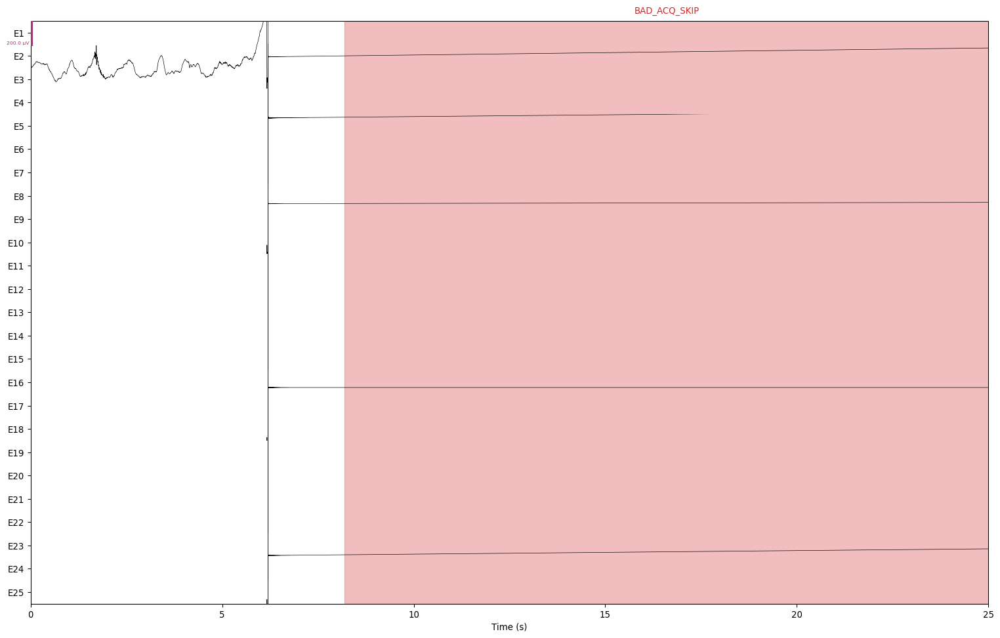

Setting 11317 of 149001 (7.60%) samples to NaN, retaining 137684 (92.40%) samples.


Effective window size : 4.096 (s)


/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/viz.py:33: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


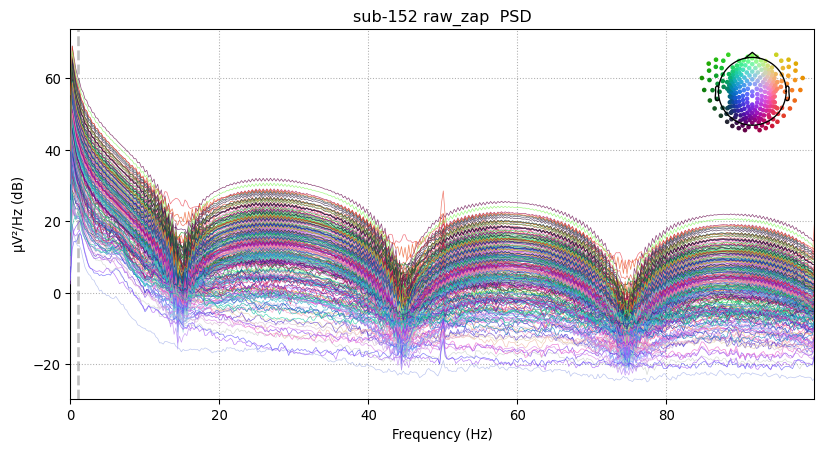

In [5]:
iter_param = {
    "nfft": 500,
    "n_iter_max": 200,
    "win_sz": 12.5,
    "spot_sz": 6,
}
raw_zap = zapline_clean(raw_filtered, fline, method="iter", iter_param=iter_param)

plot_step(
    raw_zap,
    subject,
    figures_path,
    stage="raw_zap ",
    duration=25.0,
    n_channels=25,
    fmax=h_freq,
)

In [6]:
pyprep = True

if pyprep:
    bad_channels_by_ransac = apply_pyprep(raw_zap)
else:
    bad_channels_by_ransac = get_bad_channels(raw_zap)

raw_zap.info["bads"].extend(bad_channels_by_ransac)
raw_zap.save(f"{raw_preproc_path}/sub-{subject}_filtered_zap_eeg.fif", overwrite=True)
raw_zap.info

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


Setting up high-pass filter at 1 Hz


FIR filter parameters


---------------------


Designing a one-pass, zero-phase, non-causal highpass filter:


- Windowed time-domain design (firwin) method


- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation


- Lower passband edge: 1.00


- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)


- Filter length: 413 samples (3.304 s)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s


Executing RANSAC
This may take a while, so be patient...


Finding optimal chunk size : 243


Total # of chunks: 1


Current chunk:


1



RANSAC done!


Found 17 uniquely bad channels:

0 by NaN: []

0 by flat: []

2 by deviation: ['E10', 'E216']

2 by HF noise: ['E186', 'E209']

12 by correlation: ['E68', 'E91', 'E101', 'E146', 'E154', 'E186', 'E187', 'E188', 'E199', 'E201', 'E209', 'E216']

2 by SNR: ['E209', 'E186']

0 by dropout: []

4 by RANSAC: ['E9', 'E52', 'E208', 'E254']



bad all ['E146', 'E52', 'E186', 'E199', 'E188', 'E254', 'E68', 'E154', 'E216', 'E101', 'E208', 'E91', 'E201', 'E10', 'E9', 'E209', 'E187']
Writing /Users/daniel/PhD/Projects/psd-path/analysis/data/raw/sub-152/sub-152_filtered_zap_eeg.fif


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_65482/3123248222.py:9: RuntimeWarning: Acquisition skips detected but did not fit evenly into output buffer_size, will be written as zeroes.
  raw_zap.save(


Closing /Users/daniel/PhD/Projects/psd-path/analysis/data/raw/sub-152/sub-152_filtered_zap_eeg.fif


[done]


Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,260 points
Good channels,"239 EEG, 1 ECG"
Bad channels,"VREF, E146, E52, E186, E199, E188, E254, E68, E154, E216, E101, E208, E91, E201, E10, E9, E209, E187"
EOG channels,Not available
ECG channels,ECG
Sampling frequency,500.00 Hz
Highpass,1.00 Hz
Lowpass,100.00 Hz


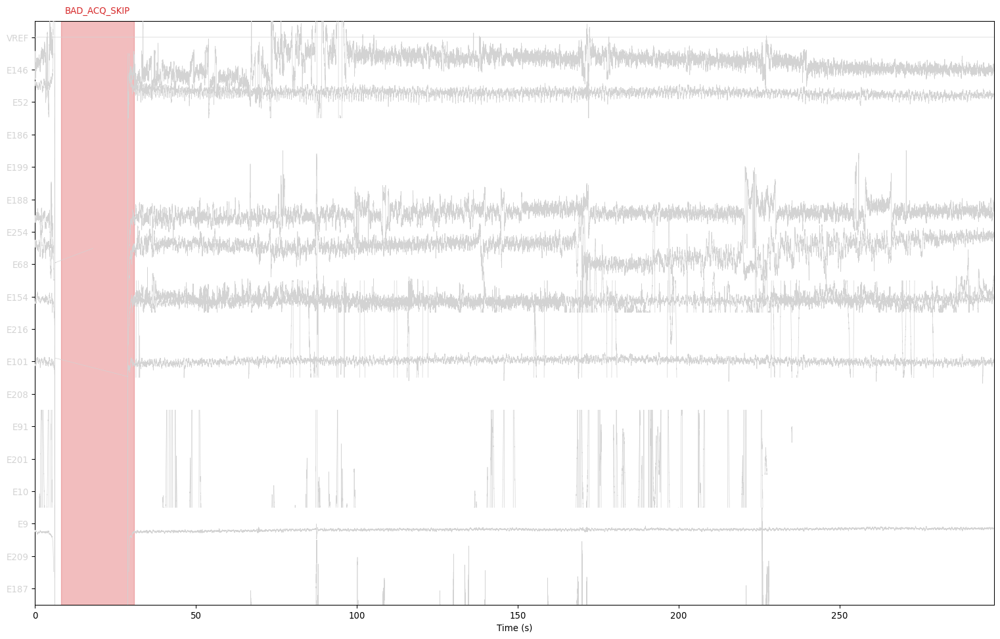

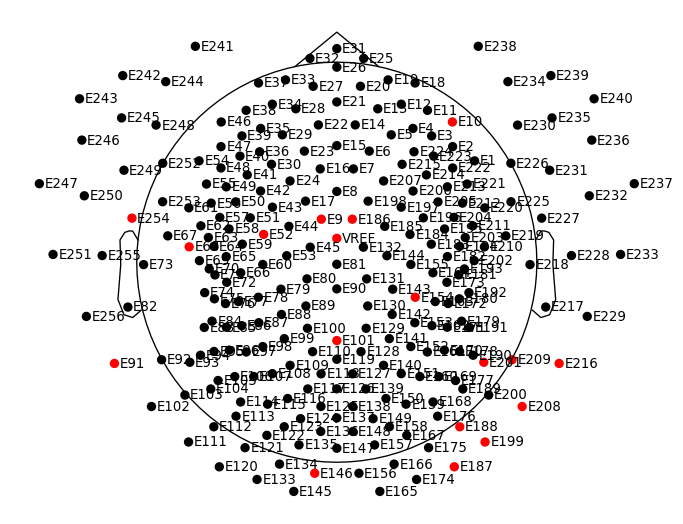

In [7]:
_ = plot_bad_channels(raw_zap, subject, figures_path=figures_path)

In [8]:
print(
    f"{subject} -  identified {len(raw_zap.info['bads'])
                               }  bad channels: {raw_zap.info['bads']}"
)
print_date_time()

152 -  identified 18  bad channels: ['VREF', 'E146', 'E52', 'E186', 'E199', 'E188', 'E254', 'E68', 'E154', 'E216', 'E101', 'E208', 'E91', 'E201', 'E10', 'E9', 'E209', 'E187']
2024-03-25 12:36:07
